# Imports and Hyperparameters

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CA"

# for the filename
parameters = "2-0_5"

# Data Preperation

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2)
position, labels, embedding = data_loader(dataset, True)
# calculate the clusters
cluster_centers = centers(position)
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 595.0539610385895
My own part is done: 106.35677242279053
Time for data preperation:  816.218542098999


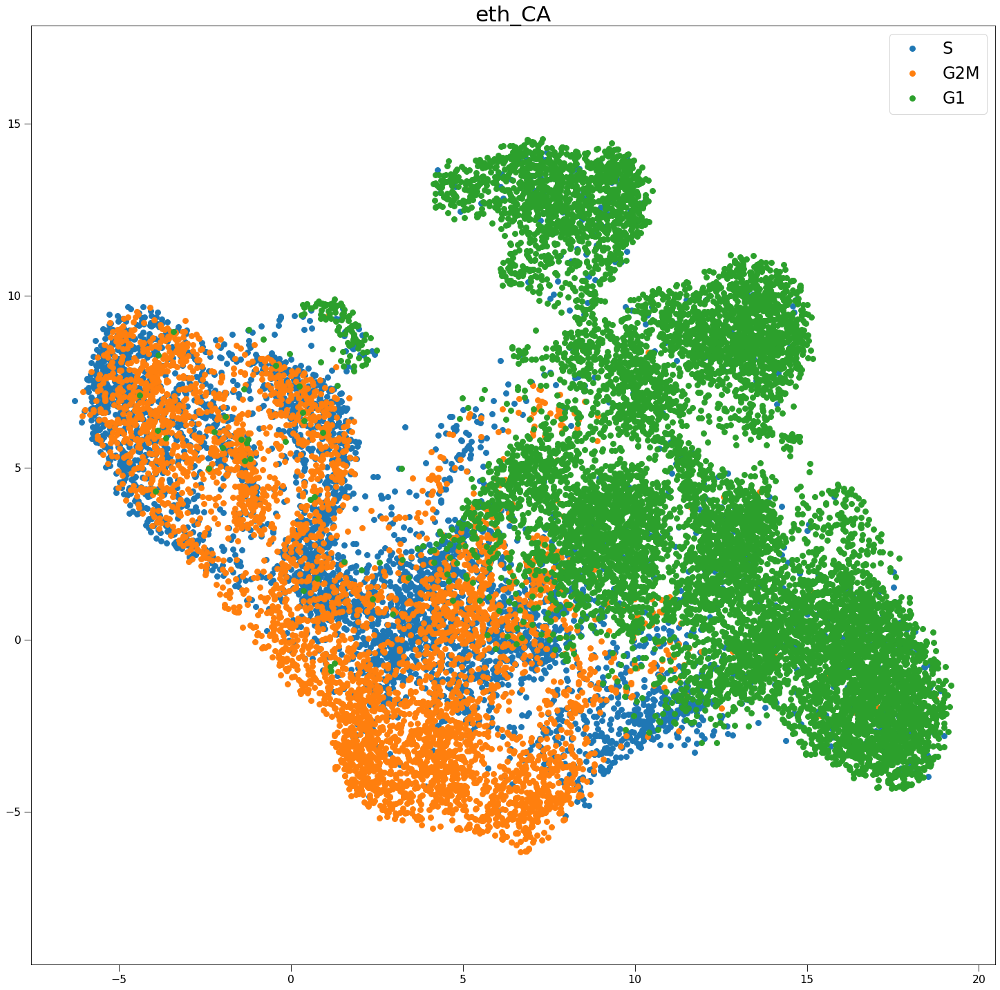

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [8]:
# Create the graph
start = time.time()

if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
    
G, _ = create_graph(number_of_nodes, mode, position=pca, beta=2, delta=0.5)
G.indexEdges()
print("Time for graph construction: ",time.time()-start)

Final k: 11



Time for graph construction:  197.588876247406


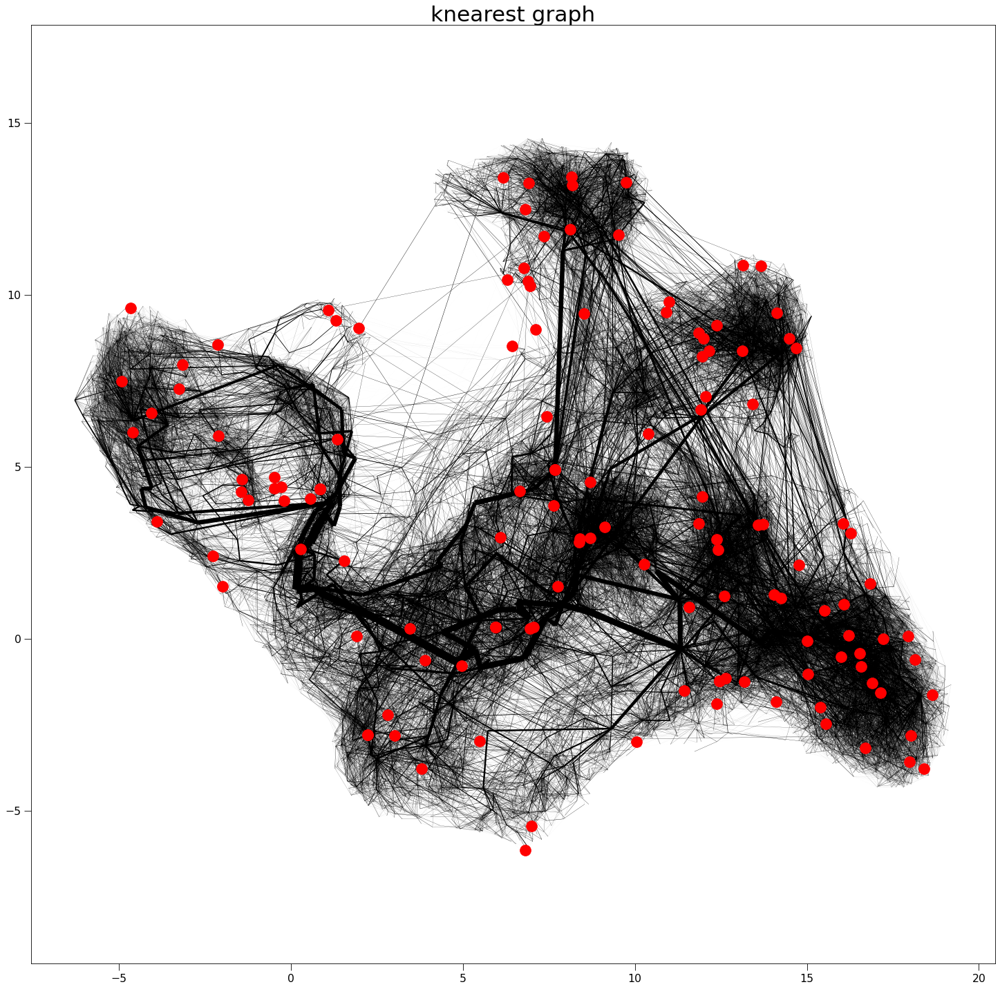

In [9]:
# plot the graph
fig, ax = plt.subplots(1, figsize=(24,24))
plot_graph(G, embedding, "knearest graph", ax, cluster_centers, node_size=0)
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()
print("Time for calculating the actual ICT: ", time.time()-start)

update Arr 185098 -> 82025
added 576 edges early
update Arr 82025 -> 74365
added 180 edges early
update Arr 74365 -> 67339
added 222 edges early
update Arr 67339 -> 61114
added 284 edges early
update Arr 61114 -> 55485
added 419 edges early
update Arr 55485 -> 50361
added 515 edges early
update Arr 50361 -> 45692
added 629 edges early
update Arr 45692 -> 41475
added 1086 edges early
update Arr 41475 -> 37642
added 959 edges early
update Arr 37642 -> 33938
added 1181 edges early
update Arr 33938 -> 30793
added 1202 edges early
update Arr 30793 -> 27993
added 1174 edges early
update Arr 27993 -> 25433
added 1172 edges early
update Arr 25433 -> 22899
added 1684 edges early
update Arr 22899 -> 20651
added 1087 edges early
update Arr 20651 -> 19028
added 1138 edges early
added 5068 edges early

Time for calculating the actual ICT:  282.2337124347687


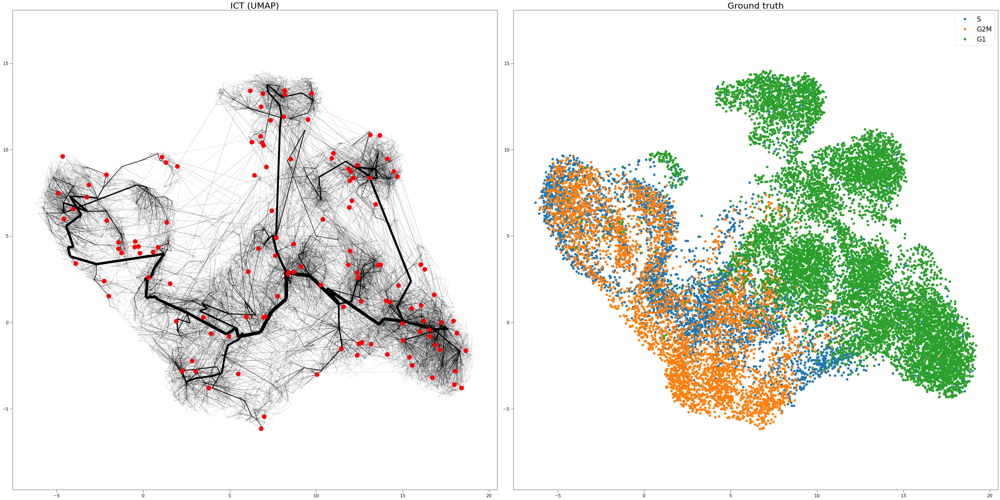

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

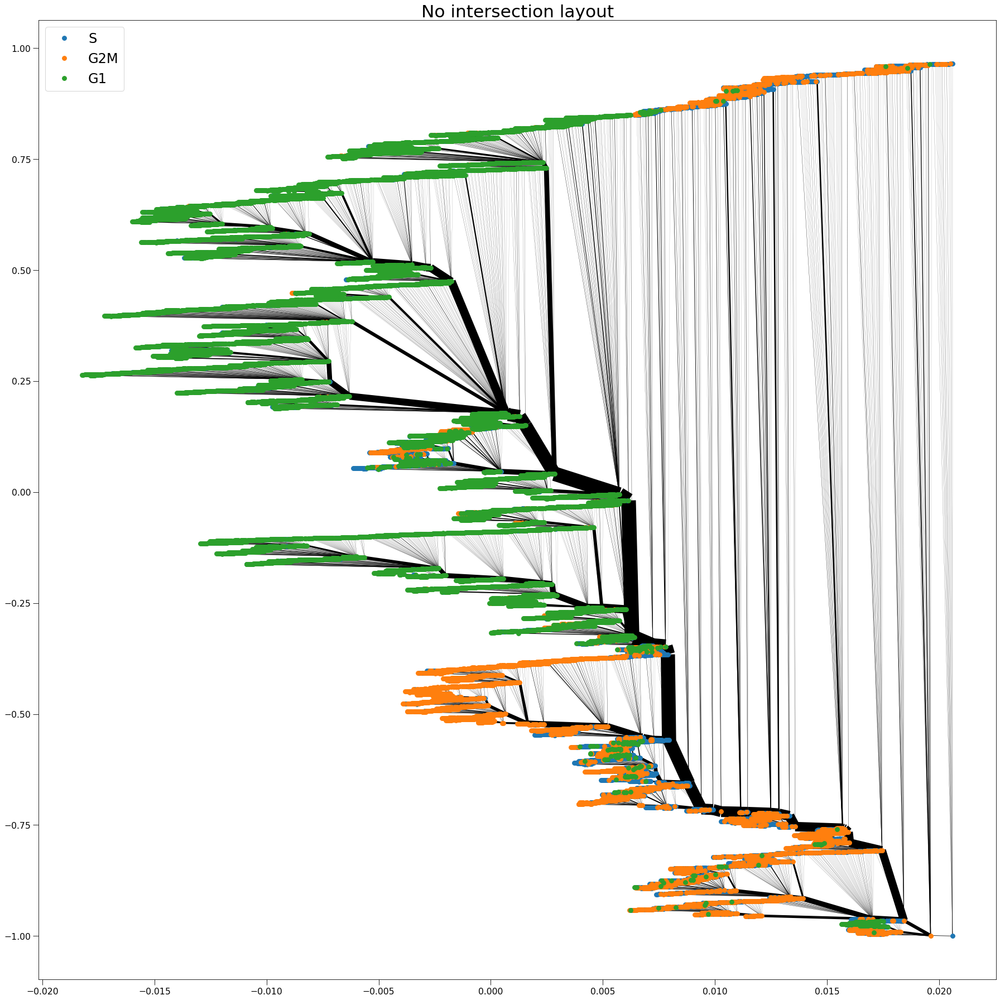

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()

# Create the MST for the DTAE autoencoder

### MST created in real space

In [14]:
nk.writeGraph(ICT,"/net/hcihome/storage/flernst/Data/eth/ICT", nk.Format.EdgeListTabOne)

sklearn is done: 225.11766052246094
My own part is done: 36.675575733184814


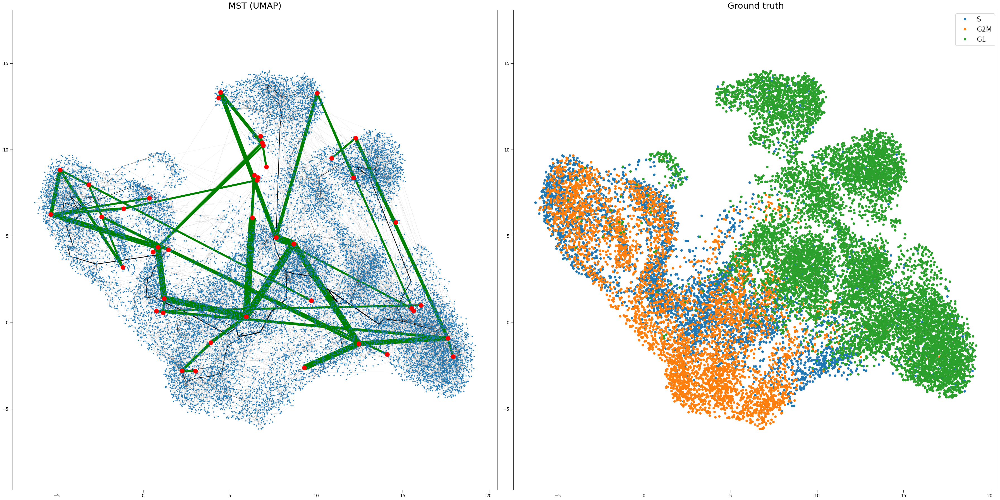

In [15]:
DTAE_centers = k_means_pp(50, position)
mst = MST(ICT, position, DTAE_centers)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-MST-"+parameters+".png")

plt.show()

### MST created in PCA space (if it exists)

sklearn is done: 228.4609935283661
My own part is done: 37.219343185424805


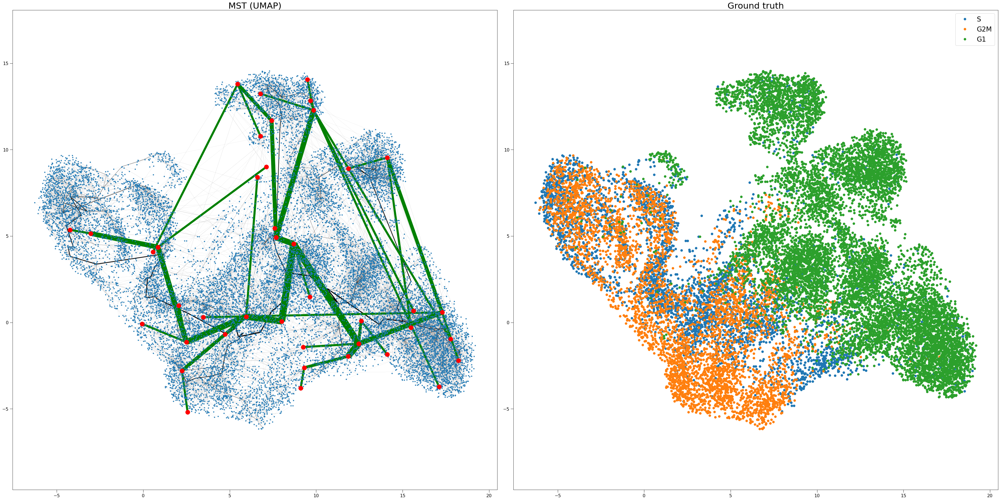

In [16]:
if len(position[0]) > 500:
    DTAE_centers = k_means_pp(50, position)
    mst = MST(ICT, pca, DTAE_centers)

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
    plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
    plot_points(embedding, "Ground truth", ax2, labels)

    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-MST-PCA-"+parameters+".png")
    plt.show()

else:
    print("PCA space was not computed before!")

### Cluster Centers in standardized space

sklearn is done: 224.25468921661377
My own part is done: 36.854626417160034


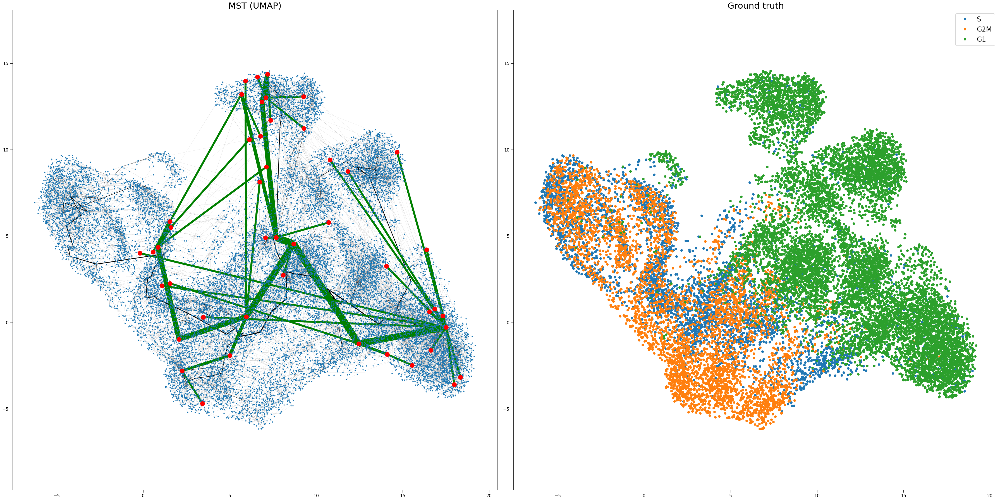

In [17]:
pos = StandardScaler().fit_transform(position)
DTAE_centers = k_means_pp(50, pos)
mst = MST(ICT, position, DTAE_centers)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
plot_graph(ICT, embedding, "ICT (UMAP)", ax1, DTAE_centers, edge_scale=0.3)
plot_graph(mst, embedding[DTAE_centers], "MST (UMAP)", ax1, edge_scale=2, node_size=0, edge_color="green")
plot_points(embedding, "Ground truth", ax2, labels)

plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-MST-"+parameters+".png")

plt.show()